#

In [1]:
import glob
import matplotlib.pylab as plt
import seaborn as sns; sns.set()

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from functools import wraps
from datetime import datetime
from typing import List, Optional, Any
from pydantic import BaseModel, Field

# -----------------------------------------------------------------------------
# Global constants and style parameters

FONT_FAMILY = 'Chilanka'

# Define 8 pastel colors for each mode.
COLORS = {
    'light': [
        '#40b4c4',  # Peacock Blue
        '#ff6961',  # Rose Pink
        '#77dd77',  # Pastel Green
        '#008080',  # Teal
        '#e0115f',  # Ruby Red
        '#d291bc',  # Pastel Purple        
        '#ffb347',  # Pastel Orange
        '#472166',  # Purple
        '#fdfd96',  # Pastel Yellow        
    ],
    'dark': [
        '#66c2ff',  # Light Pastel Blue
        '#f08080',  # Light Coral
        '#77dd77',  # Pastel Green (adjusted for dark mode)
        '#006060',  # Lighter Teal?
        #'#fff68f',  # Light Pastel Yellow
        '#b0e0e6',  # Powder Blue
        '#ffcc99',  # Light Pastel Orange
        '#dda0dd',  # Plum
        '#d3d3d3',  # Light Gray        
    ]
}

MARKERS = [
    'o',
    'x',
    '+',
    '*',
    's',
    'd',
    '^',
    'v',
]

# Define style parameters for light and dark modes.
STYLE = {
    'light': {
        "font.family": FONT_FAMILY,
        "axes.facecolor": "#eaeaf2",   # Grid background for light mode
        "figure.facecolor": "white",
        "axes.edgecolor": "black",
        "grid.color": "white",         # White grid lines
        "grid.linestyle": "-",
        "text.color": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
    },
    'dark': {
        "font.family": FONT_FAMILY,
        "axes.facecolor": "#2c2c2c", #"#343434",
        "figure.facecolor": "#181818",
        "axes.edgecolor": "white",
        "grid.color": "#666666", #"#808080",
        "grid.linestyle": "-",
        "text.color": "white",
        "axes.labelcolor": "white",
        "xtick.color": "white",
        "ytick.color": "white",
    }
}

# -----------------------------------------------------------------------------
# Decorator to save and restore matplotlib/seaborn settings

def plot(func):
    """Decorator to save and restore matplotlib and seaborn settings."""
    @wraps(func)
    def wrapper(*args, **kwargs):
        # Save original rcParams and seaborn style.
        original_rc_params = plt.rcParams.copy()
        original_style = sns.axes_style()
        try:
            return func(*args, **kwargs)
        finally:
            plt.rcParams.update(original_rc_params)
            sns.set_theme(style=original_style)
    return wrapper

# -----------------------------------------------------------------------------
# Pydantic models

class Gpt2ConfigModel(BaseModel):
    block_size: int
    vocab_size: int
    n_layer: int
    n_head: int
    n_embd: int

class GenerateArgsModel(BaseModel):
    log_level: str
    model: str
    device: str
    max_length: int
    top_k: int
    seed: int
    prompt: str
    torch_compile: bool
    torch_jit: bool
    torch_compile_fullgraph: bool
    torch_compile_reduce_overhead: bool
    torch_compile_max_autotune: bool
    generate_slim: bool
    rounds: int
    wrap: int
    note: str

class GenerateRun(BaseModel):
    rates: List[float]
    # Rename the JSON key "model_config" to our field "gpt2_config"
    gpt2_config: Gpt2ConfigModel = Field(..., alias="model_config")
    args: GenerateArgsModel
    start_timestamp: datetime
    end_timestamp: datetime
    elapsed: str
    device_name: str
    conda_env_name: str
    is_gil_enabled: bool
    note: str
    filename: Optional[str] = None


    @classmethod
    def load(cls, json_path: str) -> "GenerateRunModel":
        """
        Load a JSON file from `json_path` and return a GenerateRunModel instance.
        Pydantic automatically converts ISO datetime strings to datetime objects.
        """
        obj = cls.parse_file(json_path)
        obj.filename = json_path
        return obj

    @classmethod
    def load_all_from_directory(cls, directory: str) -> List["GenerateRunModel"]:
        # Get a list of all JSON files in the specified directory
        json_paths = sorted(glob.glob(os.path.join(directory, "*.json")))

        runs = [ cls.load(p) for p in json_paths ]
        return runs

    @property
    def label(self) -> str:
        l = f'[{self.conda_env_name}]: '

        args = self.args
        if args.generate_slim:
            l += 'generate_slim()'
        else:
            l += 'generate()'

        if args.torch_compile:
            l += ': compile'
            if args.torch_compile_fullgraph:
                l += ', fullgraph'
            if args.torch_compile_reduce_overhead:
                assert not args.torch_compile_max_autotune, self
                l += ', reduce-overhead'
            elif args.torch_compile_max_autotune:
                l += ', max-autotune'

        l += f' ({self.elapsed_human})'
        
        return l

    @property
    def label_box(self) -> str:
        l = f'[{self.conda_env_name}]\n'
        
        args = self.args
        if args.generate_slim:
            l += 'generate_slim()'
        else:
            l += 'generate()'
        
        if args.torch_compile:
            l += '\ncompile'
            if args.torch_compile_fullgraph:
                l += '\nfullgraph'
            if args.torch_compile_reduce_overhead:
                assert not args.torch_compile_max_autotune, self
                l += '\nreduce-overhead'
            elif args.torch_compile_max_autotune:
                l += '\nmax-autotune'

        l += f'\n({self.elapsed_human})'

        return l

    @property
    def elapsed_human(self) -> str:
        # If elapsed time is 60 seconds or more, break it into minutes and seconds.
        elapsed = float(self.elapsed)
        if elapsed >= 60.0:
            minutes, seconds = divmod(elapsed, 60)
            # Convert minutes to an integer for display.
            minutes = int(minutes)
            return f"{minutes}m, {seconds:.1f}s"
        else:
            # For durations under 60 seconds, just show the seconds.
            return f"{elapsed:.1f}s"
    
    
    @classmethod
    @plot
    def plot_rates(cls, runs: List["GenerateRun"],
                   mode: str, title: str, filename: str = None):
        """
        Plot the 'rates' for multiple runs as line plots.
        
        Arguments:

            runs (List[GenerateRun]): Supplies a list of between 1
                and runs to plot.

            mode (str): Supplies either 'light' or 'dark' mode.

            title (str): Supplies the title for the plot.

            filename (str): Optionally supplies a filename to
                which the plot will be saved if provided.
        """
        # Validate mode.
        assert mode in ('light', 'dark'), f"Invalid mode: {mode}"
        # Enforce maximum of 8 runs.
        assert len(runs) <= 8, "Supports up to 8 runs only."

        # Update rcParams with our custom style for the mode.
        plt.rcParams.update(STYLE[mode])

        fig, ax = plt.subplots(figsize=(10, 10))
        
        # Plot each run's rates.
        for idx, run in enumerate(runs):
            x = np.arange(len(run.rates))
            y = run.rates
            color = COLORS[mode][idx]
            ax.plot(
                x, y,
                marker=MARKERS[idx],
                linestyle='-',
                color=color,
                label=run.label,
                alpha=0.8,  # Set line transparency
                #markerfacecolor=color,  # Marker fill uses the same color
                #markeredgecolor='white',  # White outline for markers
                #markeredgewidth=0.8       # Very thin outline width
            )
        
        ax.set_xlabel("Run Number")
        ax.set_ylabel("Rate (Tokens/Sec)")
        ax.set_title(title)
        ax.legend()
        
        # Set x-axis ticks to display as integers.
        from matplotlib.ticker import MultipleLocator
        ax.xaxis.set_major_locator(MultipleLocator(1))
        
        if mode == 'light:':
            ax.grid(True)
        else:
            ax.grid(True, linewidth=0.5)

        # Save the figure if a filename is provided.
        if filename:
            assert '.' in filename, f"Filename must have an extension: {filename}"
            file_format = filename.split('.')[-1]
            if mode == 'dark':
                plt.savefig(
                    filename,
                    format=file_format,
                    facecolor=STYLE['dark']["figure.facecolor"],
                )
            else:
                plt.savefig(filename, format=file_format)
        
        plt.show()

    @classmethod
    @plot
    def plot_rates_box(cls, runs: List["GenerateRun"],
                       mode: str, skip_first: bool, title: str,
                       filename: str = None):
        """
        Plot the 'rates' for multiple runs as box and whisker plots.
        
        Arguments:
            runs (List[GenerateRun]): Supplies a list of between 1 and 8 runs to plot.
            mode (str): Supplies either 'light' or 'dark' mode.
            title (str): Supplies the title for the plot.
            filename (str): Optionally supplies a filename to which the plot will be saved if provided.
        """
        # Validate mode.
        assert mode in ('light', 'dark'), f"Invalid mode: {mode}"
        # Enforce maximum of 8 runs.
        assert len(runs) <= 8, "Supports up to 8 runs only."

        # Update rcParams with our custom style for the mode.
        plt.rcParams.update(STYLE[mode])
        
        fig, ax = plt.subplots(figsize=(10, 10))
        
        # Prepare the data: a list of lists, one per run.
        if skip_first:
            data = [run.rates[1:] for run in runs]
        else:
            data = [run.rates[1:] for run in runs]
        # Positions for each box (1-indexed).
        positions = list(range(1, len(runs) + 1))
        
        # Create the boxplot. Use patch_artist=True so we can fill the boxes with color.
        bp = ax.boxplot(data, positions=positions, patch_artist=True, showmeans=True)
        
        # Set the facecolor and transparency for each box.
        for idx, box in enumerate(bp['boxes']):
            box.set_facecolor(COLORS[mode][idx])
            box.set_alpha(0.8)

        if False:
            
            # Customize medians, whiskers, caps, and fliers.
            for median in bp['medians']:
                median.set(color='white', linewidth=2)
            for whisker in bp['whiskers']:
                whisker.set(color='white', linewidth=1)
            for cap in bp['caps']:
                cap.set(color='white', linewidth=1)
            for flier in bp['fliers']:
                flier.set(marker='o', color='white', alpha=0.8, markersize=5, markeredgecolor='white')

        else:
            # Customize medians.
            for idx, median in enumerate(bp['medians']):
                median.set(color=COLORS[mode][idx], linewidth=2)
            
            # Customize whiskers and caps.
            # Note: Each box has 2 whiskers and 2 caps; they are stored in order.
            for idx in range(len(runs)):
                bp['whiskers'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
                bp['whiskers'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
                bp['caps'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
                bp['caps'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
            
            # Customize fliers.
            # Each flier corresponds to one box (i.e. one run) and contains all outlier markers for that box.
            for idx, flier in enumerate(bp['fliers']):
                flier.set(marker='o',
                          color=COLORS[mode][idx],
                          alpha=0.8,
                          markersize=5,
                          markeredgecolor=COLORS[mode][idx])        
        
        # Set x-axis ticks: one tick per run using each run's label.
        ax.set_xticks(positions)
        #ax.set_xticklabels([run.label_box for run in runs], rotation=45, ha='center')
        ax.set_xticklabels([run.label_box for run in runs], ha='center')
        ax.tick_params(axis='x', labelsize=7)
        ax.set_xlabel("Run")
        ax.set_ylabel("Rate (Tokens/Sec)")
        ax.set_title(title)
        
        # Turn on the grid.
        ax.grid(True, linewidth=0.5)
        
        # Save the figure if a filename is provided.
        if filename:
            assert '.' in filename, f"Filename must have an extension: {filename}"
            file_format = filename.split('.')[-1]
            if mode == 'dark':
                plt.savefig(
                    filename,
                    format=file_format,
                    facecolor=STYLE['dark']["figure.facecolor"],
                )
            else:
                plt.savefig(filename, format=file_format)
        
        plt.show()

    @classmethod
    @plot
    def plot_rates_box_swapped(cls, runs: List["GenerateRun"],
                               mode: str, skip_first: bool, title: str, 
                               filename: str = None):
        """
        Plot the 'rates' for multiple runs as horizontal box and whisker plots.
        
        The boxes are drawn horizontally so that the run.label values appear on the y-axis.
        
        Arguments:
            runs (List[GenerateRun]): A list of between 1 and 8 runs to plot.
            mode (str): Either 'light' or 'dark'.
            title (str): The title for the plot.
            filename (str): Optionally, a filename to which the plot will be saved.
        """
        # Validate mode and maximum run count.
        assert mode in ('light', 'dark'), f"Invalid mode: {mode}"
        assert len(runs) <= 8, "Supports up to 8 runs only."

        runs = list(reversed(runs))
        
        # Update rcParams with our custom style.
        plt.rcParams.update(STYLE[mode])
        
        fig, ax = plt.subplots(figsize=(10, 10))
        
        # Prepare the data: one list of rates per run.
        if skip_first:
            data = [run.rates[1:] for run in runs]
        else:
            data = [run.rates[1:] for run in runs]
            
        # Positions for each box (1-indexed).
        positions = list(range(1, len(runs) + 1))
        
        # Create a horizontal boxplot by setting vert=False.
        bp = ax.boxplot(data, positions=positions, patch_artist=True, showmeans=True, vert=False)
        
        # Color each box and set transarency.
        for idx, box in enumerate(bp['boxes']):
            box.set_facecolor(COLORS[mode][idx])
            box.set_alpha(0.8)

        if False:
            
            # Customize medians, whiskers, caps, and fliers.
            for median in bp['medians']:
                median.set(color='white', linewidth=2)
            for whisker in bp['whiskers']:
                whisker.set(color='white', linewidth=1)
            for cap in bp['caps']:
                cap.set(color='white', linewidth=1)
            for flier in bp['fliers']:
                flier.set(marker='o', color='white', alpha=0.8, markersize=5, markeredgecolor='white')

        else:
            # Customize medians.
            for idx, median in enumerate(bp['medians']):
                median.set(color=COLORS[mode][idx], linewidth=2)
            
            # Customize whiskers and caps.
            # Note: Each box has 2 whiskers and 2 caps; they are stored in order.
            for idx in range(len(runs)):
                bp['whiskers'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
                bp['whiskers'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
                bp['caps'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
                bp['caps'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
            
            # Customize fliers.
            # Each flier corresponds to one box (i.e. one run) and contains all outlier markers for that box.
            for idx, flier in enumerate(bp['fliers']):
                flier.set(marker='o',
                          color=COLORS[mode][idx],
                          alpha=0.8,
                          markersize=5,
                          markeredgecolor=COLORS[mode][idx])
        
        # For horizontal boxplots, the run labels go on the y-axis.
        ax.set_yticks(positions)
        ax.set_yticklabels([run.label_box for run in runs])
        ax.tick_params(axis='y', labelsize=8)
        ax.set_xlabel("Rate (Tokens/Sec)")
        ax.set_ylabel("Run")
        ax.set_title(title)
        ax.grid(True, linewidth=0.5)
        
        # Save the figure if a filename is provided.
        if filename:
            assert '.' in filename, f"Filename must have an extension: {filename}"
            file_format = filename.split('.')[-1]
            if mode == 'dark':
                plt.savefig(filename, format=file_format, facecolor=STYLE['dark']["figure.facecolor"])
            else:
                plt.savefig(filename, format=file_format)
        
        plt.show()

    @classmethod
    @plot
    def plot_rates_combined(cls, runs: List["GenerateRun"],
                            mode: str, title: str, filename: str = None,
                            skip_first: bool = False):
        """
        Combine the rates line plot and the box/whisker plot into one figure.
        The line plot sits on top and the box plot sits on the bottom.
        
        Arguments:
            runs (List[GenerateRun]): A list of 1 to 8 runs.
            mode (str): Either 'light' or 'dark'.
            title (str): Supplies the base title for the combined plot.
            filename (str): Optionally supplies a filename to save the figure.
            skip_first (bool): If True, use run.rates[1:] for the box plot.
                              Otherwise, use the full run.rates.
        """
        # Validate mode and run count.
        assert mode in ('light', 'dark'), f"Invalid mode: {mode}"
        assert len(runs) <= 8, "Supports up to 8 runs only."
        
        # Update rcParams with our custom style.
        plt.rcParams.update(STYLE[mode])
        
        # Create a figure with two subplots (vertical layout)
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 20))
        
        # ---------------------------
        # Upper subplot: Line Plot
        # ---------------------------
        for idx, run in enumerate(runs):
            x = np.arange(len(run.rates))
            y = run.rates
            color = COLORS[mode][idx]
            ax1.plot(
                x, y,
                marker=MARKERS[idx],
                linestyle='-',
                color=color,
                label=run.label,
                alpha=0.8
            )
        ax1.set_xlabel("Iteration")
        ax1.set_ylabel("Rate (Tokens/Sec)")
        ax1.set_title(title + " - Line Plot")
        ax1.legend()
        
        # Ensure every integer on the x-axis gets a tick.
        from matplotlib.ticker import MultipleLocator
        ax1.xaxis.set_major_locator(MultipleLocator(1))
        
        # Set grid. (Light mode uses the default grid; dark mode a thinner grid.)
        if mode == 'light':
            ax1.grid(True)
        else:
            ax1.grid(True, linewidth=0.5)
        
        # ---------------------------
        # Lower subplot: Box & Whisker Plot
        # ---------------------------
        # Use either the full rates or skip the first value.
        data = [run.rates[1:] if skip_first else run.rates for run in runs]
        positions = list(range(1, len(runs) + 1))
        
        bp = ax2.boxplot(data, positions=positions, patch_artist=True, showmeans=True)
        
        # Color each box.
        for idx, box in enumerate(bp['boxes']):
            box.set_facecolor(COLORS[mode][idx])
            box.set_alpha(0.8)
        
        # Customize medians.
        for idx, median in enumerate(bp['medians']):
            median.set(color=COLORS[mode][idx], linewidth=2)
        
        # Customize whiskers and caps (each box has 2 of each).
        for idx in range(len(runs)):
            bp['whiskers'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
            bp['whiskers'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
            bp['caps'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
            bp['caps'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
        
        # Customize fliers (outliers).
        for idx, flier in enumerate(bp['fliers']):
            flier.set(marker='o',
                      color=COLORS[mode][idx],
                      alpha=0.8,
                      markersize=5,
                      markeredgecolor=COLORS[mode][idx])
        
        # Set x-axis ticks and labels (using the run.label_box property).
        ax2.set_xticks(positions)
        ax2.set_xticklabels([run.label_box for run in runs], ha='center')
        ax2.tick_params(axis='x', labelsize=8)
        ax2.set_xlabel("Run Configuration")
        ax2.set_ylabel("Rate (Tokens/Sec)")
        ax2.set_title(title + " - Box Plot")
        ax2.grid(True, linewidth=0.5)
        
        # Save the figure if a filename is provided.
        if filename:
            assert '.' in filename, f"Filename must have an extension: {filename}"
            file_format = filename.split('.')[-1]
            if mode == 'dark':
                plt.savefig(filename, format=file_format, facecolor=STYLE['dark']["figure.facecolor"])
            else:
                plt.savefig(filename, format=file_format)
        
        plt.show()

    @classmethod
    @plot
    def plot_rates_combined_side_by_side(cls, runs: List["GenerateRun"],
                                         mode: str, title: str, filename: str = None,
                                         skip_first: bool = False):
        """
        Combine the rates line plot and the box/whisker plot into one figure,
        arranged side-by-side.
        
        Arguments:
            runs (List[GenerateRun]): A list of 1 to 8 runs.
            mode (str): Either 'light' or 'dark'.
            title (str): Supplies the base title for the combined plot.
            filename (str): Optionally supplies a filename to save the figure.
            skip_first (bool): If True, use run.rates[1:] for the box plot;
                               otherwise, use the full run.rates.
        """
        # Validate mode and run count.
        assert mode in ('light', 'dark'), f"Invalid mode: {mode}"
        assert len(runs) <= 8, "Supports up to 8 runs only."
        
        # Update rcParams with our custom style.
        plt.rcParams.update(STYLE[mode])
        
        # Create a figure with two subplots side-by-side.
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))
        
        # ---------------------------
        # Left subplot: Line Plot
        # ---------------------------
        for idx, run in enumerate(runs):
            x = np.arange(len(run.rates))
            y = run.rates
            color = COLORS[mode][idx]
            ax1.plot(
                x, y,
                marker=MARKERS[idx],
                linestyle='-',
                color=color,
                label=run.label,
                alpha=0.8
            )
        ax1.set_xlabel("Iteration")
        ax1.set_ylabel("Rate (Tokens/Sec)")
        ax1.set_title(title + " - Line Plot")
        ax1.legend()
        
        # Ensure every integer on the x-axis gets a tick.
        from matplotlib.ticker import MultipleLocator
        ax1.xaxis.set_major_locator(MultipleLocator(1))
        
        if mode == 'light':
            ax1.grid(True)
        else:
            ax1.grid(True, linewidth=0.5)
        
        # ---------------------------
        # Right subplot: Box & Whisker Plot
        # ---------------------------
        data = [run.rates[1:] if skip_first else run.rates for run in runs]
        positions = list(range(1, len(runs) + 1))
        
        bp = ax2.boxplot(data, positions=positions, patch_artist=True, showmeans=True)
        
        # Color each box.
        for idx, box in enumerate(bp['boxes']):
            box.set_facecolor(COLORS[mode][idx])
            box.set_alpha(0.8)
        
        # Customize medians.
        for idx, median in enumerate(bp['medians']):
            median.set(color=COLORS[mode][idx], linewidth=2)
        
        # Customize whiskers and caps (each box has 2 of each).
        for idx in range(len(runs)):
            bp['whiskers'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
            bp['whiskers'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
            bp['caps'][2 * idx].set(color=COLORS[mode][idx], linewidth=1)
            bp['caps'][2 * idx + 1].set(color=COLORS[mode][idx], linewidth=1)
        
        # Customize fliers (outliers).
        for idx, flier in enumerate(bp['fliers']):
            flier.set(marker='o',
                      color=COLORS[mode][idx],
                      alpha=0.8,
                      markersize=5,
                      markeredgecolor=COLORS[mode][idx])
        
        # Set x-axis ticks and labels (using the run.label_box property).
        ax2.set_xticks(positions)
        ax2.set_xticklabels([run.label_box for run in runs], ha='center')
        ax2.tick_params(axis='x', labelsize=7)
        ax2.set_xlabel("Run")
        ax2.set_ylabel("Rate (Tokens/Sec)")
        ax2.set_title(title + " - Box Plot")
        ax2.grid(True, linewidth=0.5)
        
        # Save the figure if a filename is provided.
        if filename:
            assert '.' in filename, f"Filename must have an extension: {filename}"
            file_format = filename.split('.')[-1]
            if mode == 'dark':
                plt.savefig(filename, format=file_format, facecolor=STYLE['dark']["figure.facecolor"])
            else:
                plt.savefig(filename, format=file_format)
        
        plt.show()



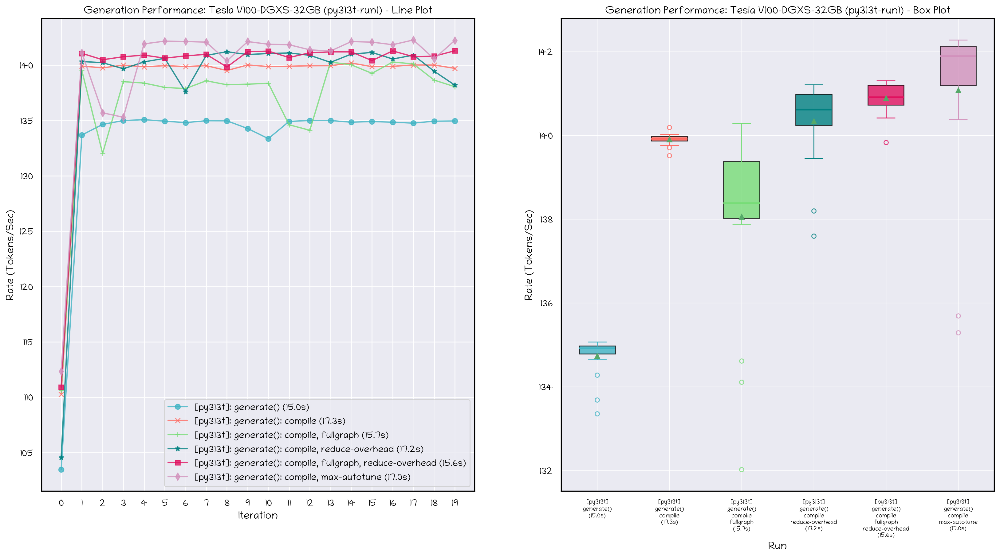

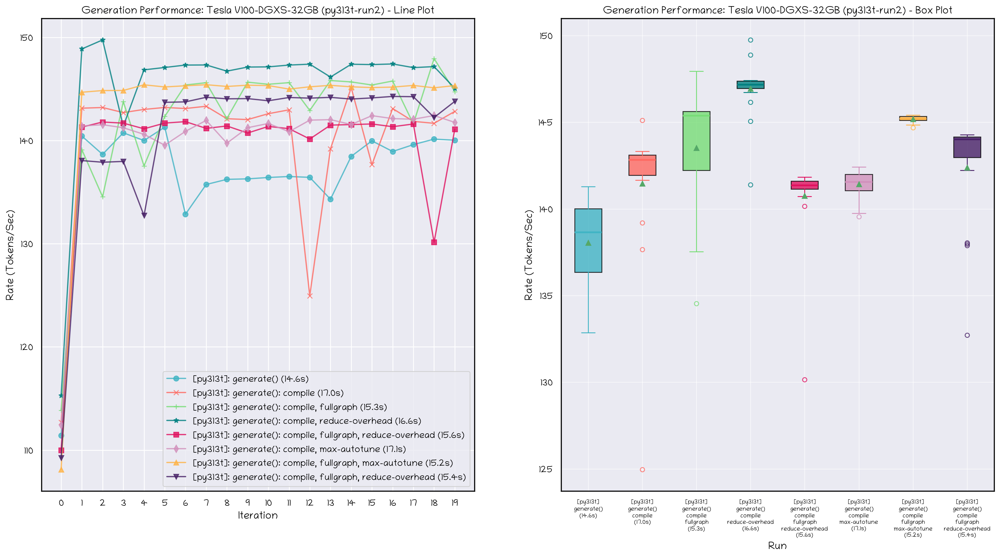

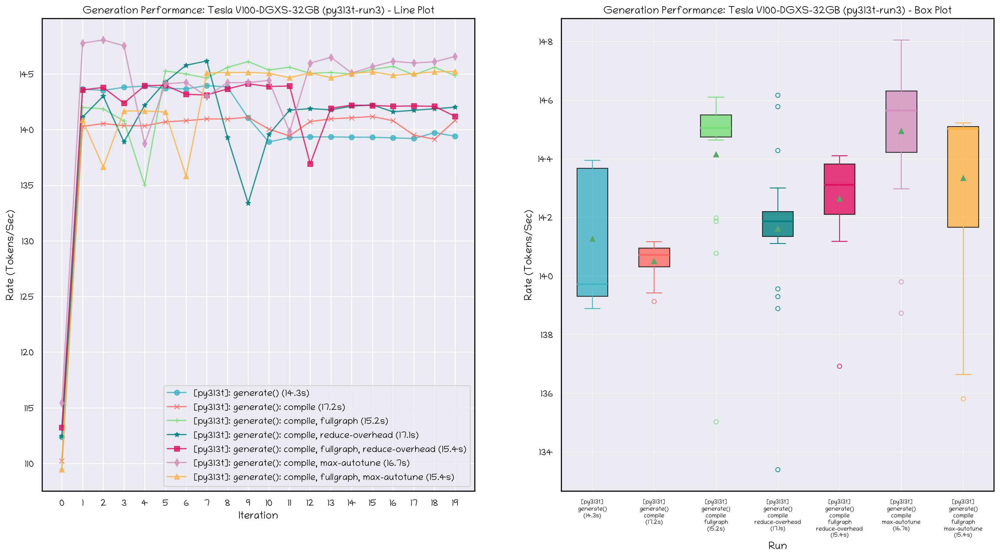

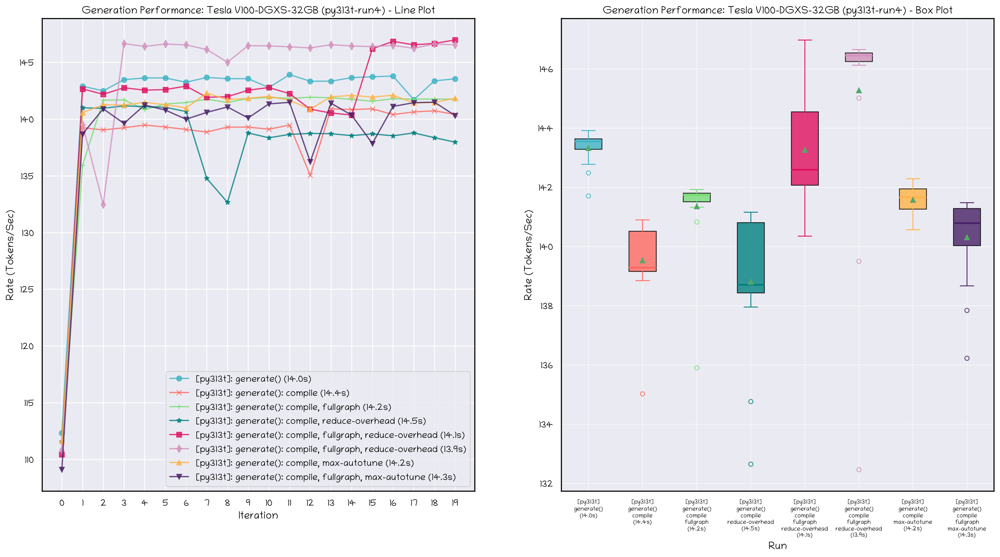

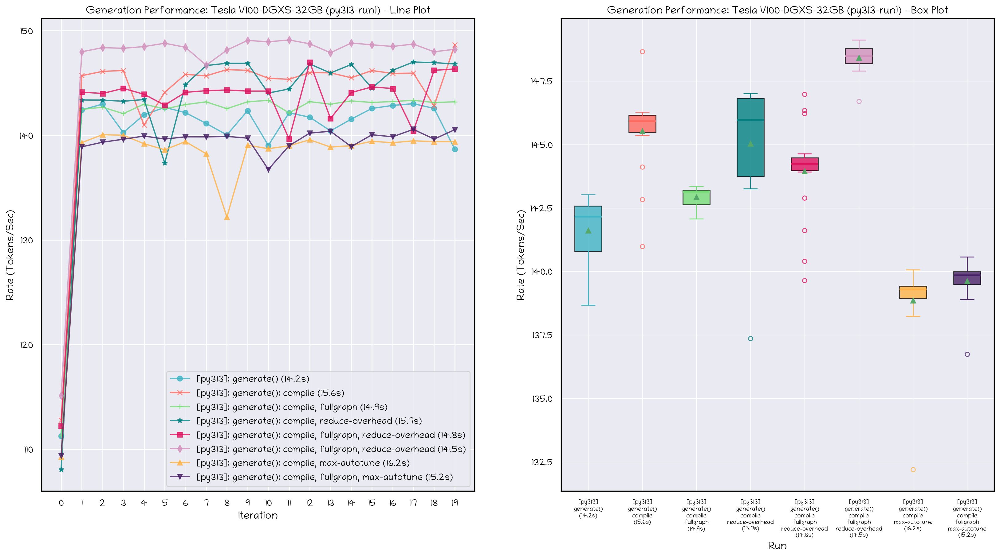

...

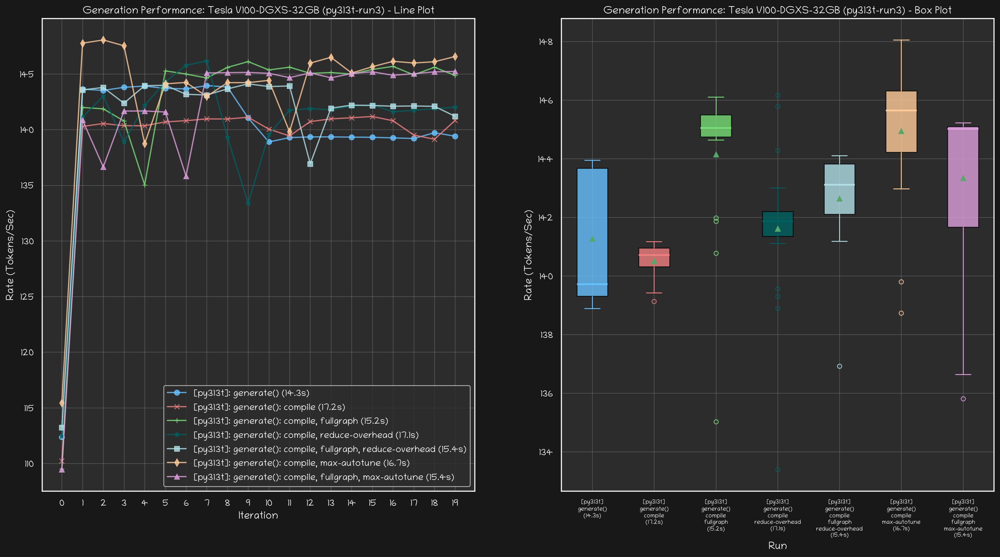

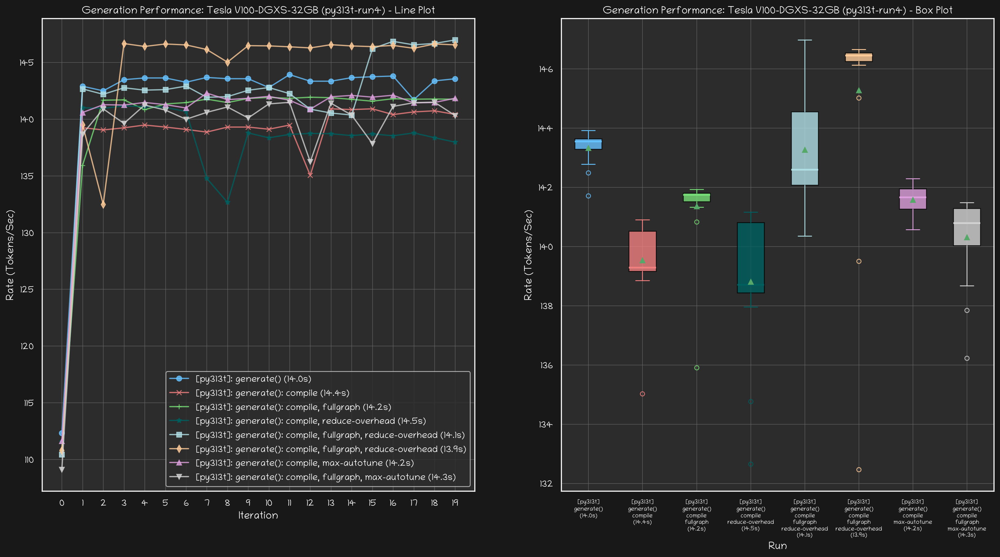

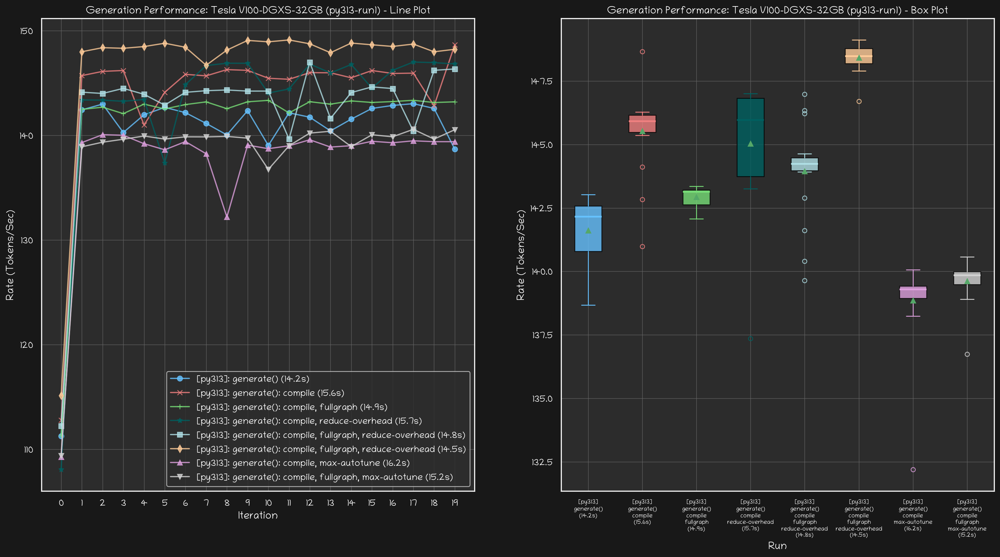

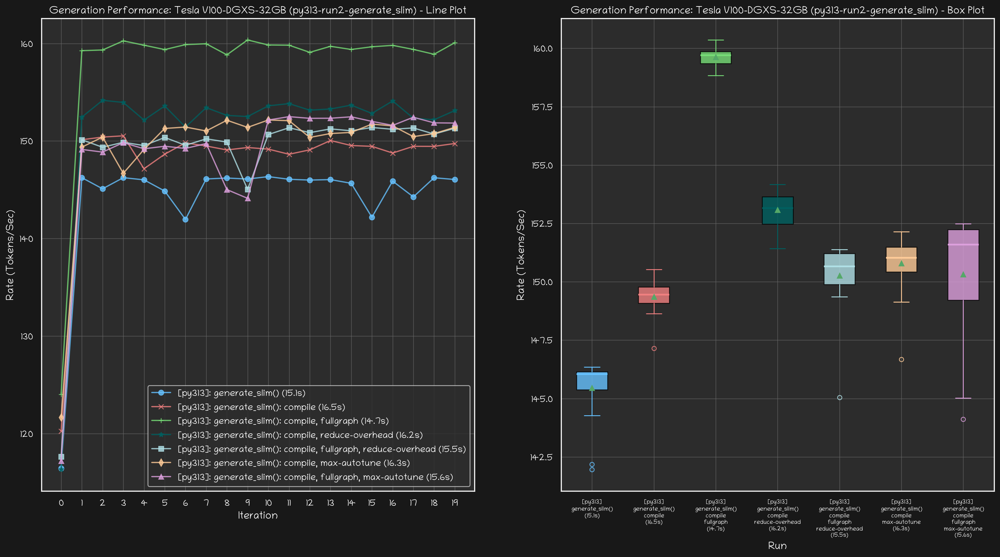

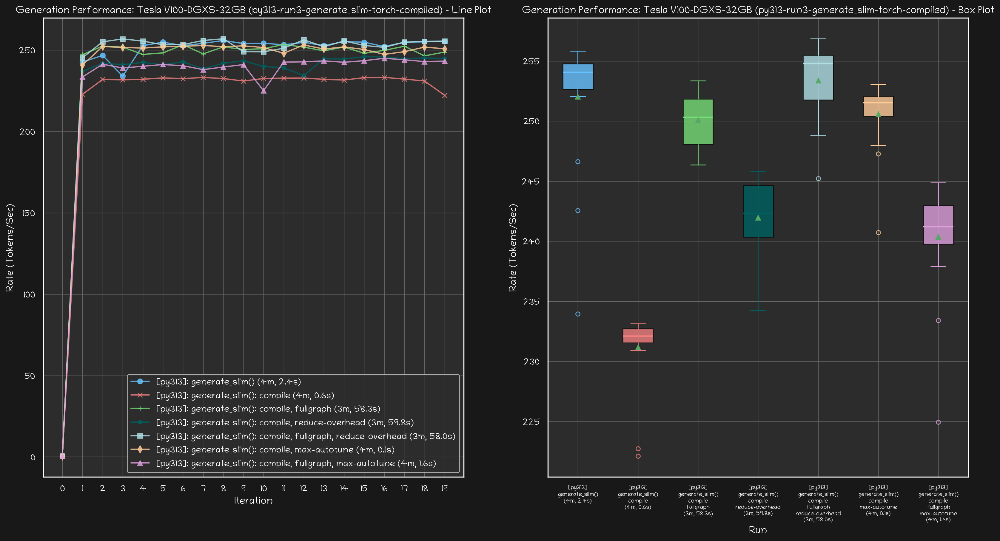

In [5]:
run_names = [
    'py313t-run1',
    'py313t-run2',
    'py313t-run3',
    'py313t-run4',
    'py313-run1',
    'py313-run2-generate_slim',    
    'py313-run3-generate_slim-torch-compiled',
]
for mode in ('light', 'dark'):
    for run_name in run_names:
        runs = GenerateRun.load_all_from_directory(f'json/{run_name}')
        device_names = {run.device_name for run in runs}
        assert len(device_names) == 1
        device_name = runs[0].device_name
        GenerateRun.plot_rates_combined_side_by_side(
            runs=runs,
            mode=mode,
            title=f'Generation Performance: {device_name} ({run_name})',
            filename=f'{run_name}-combined-side-by-side-{mode}.svg',
            skip_first=True,
        )

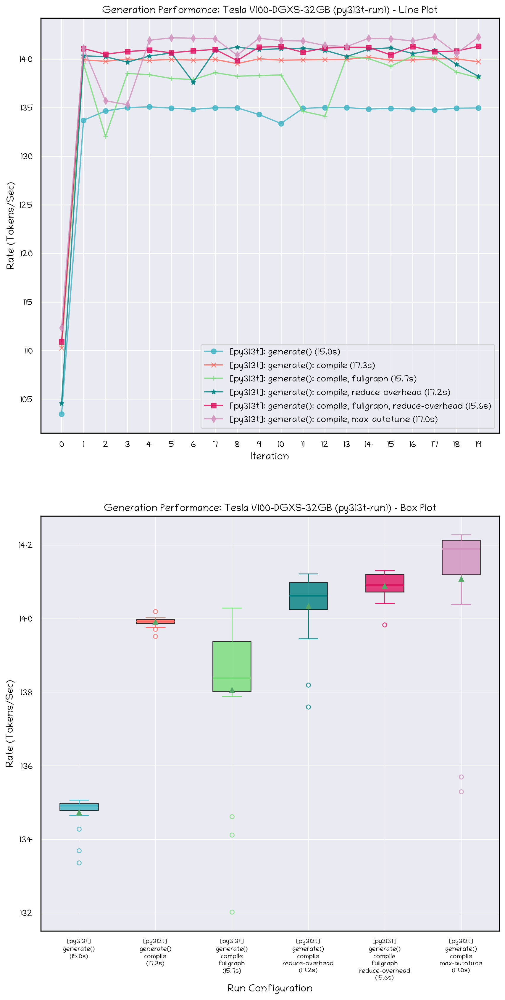

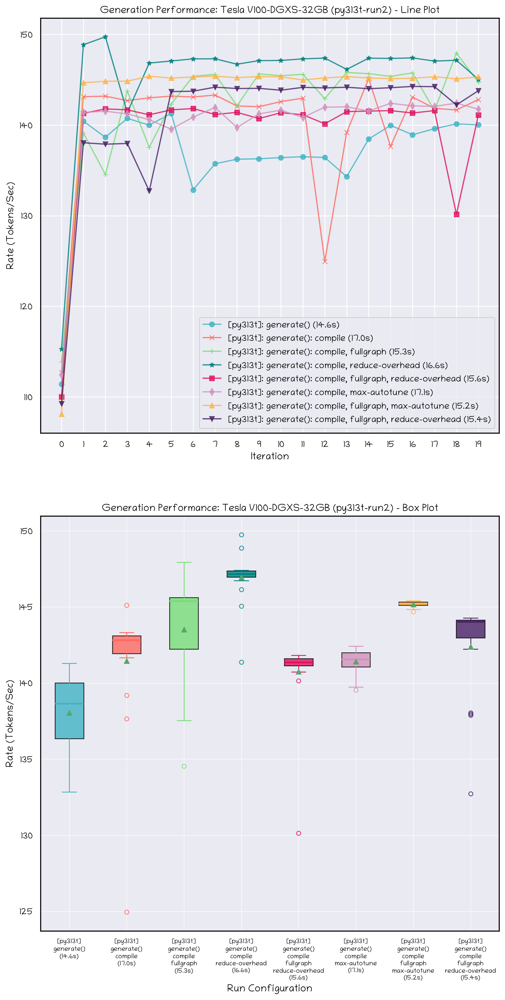

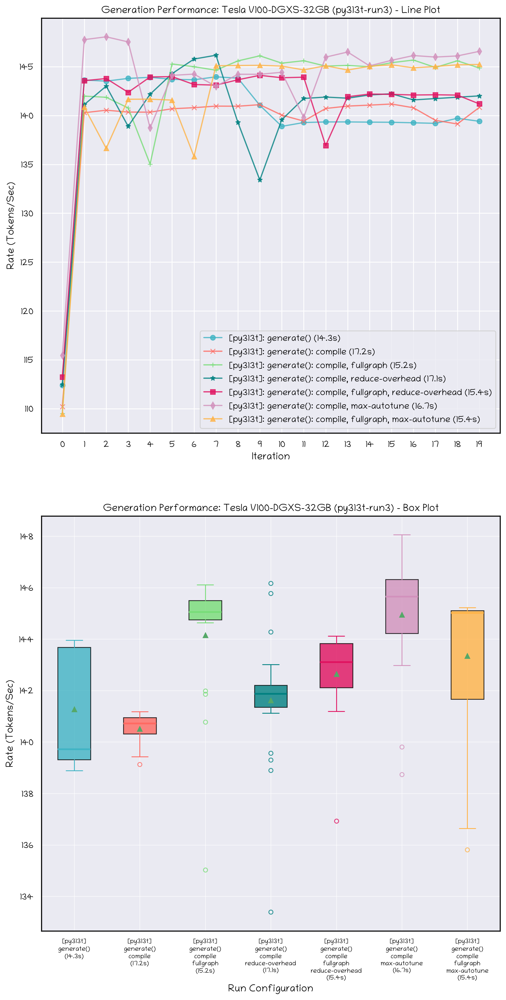

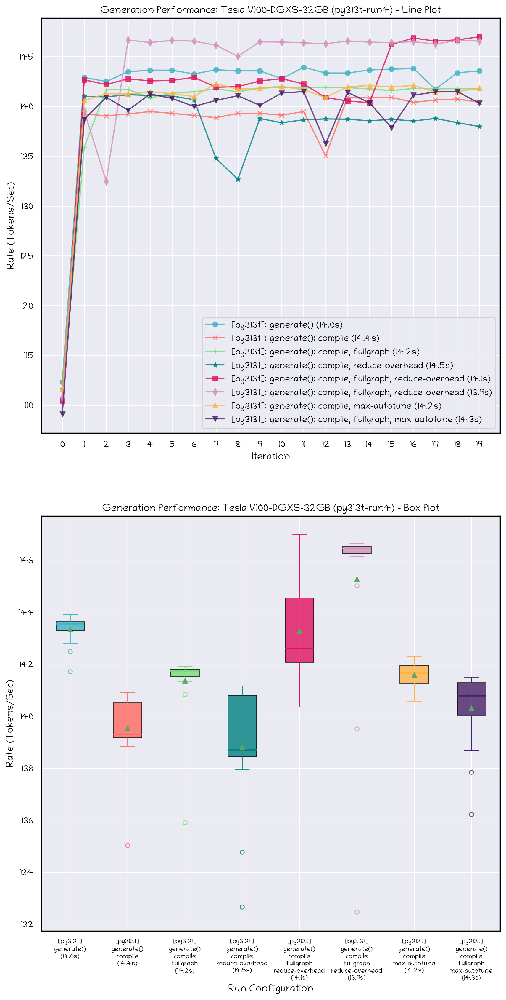

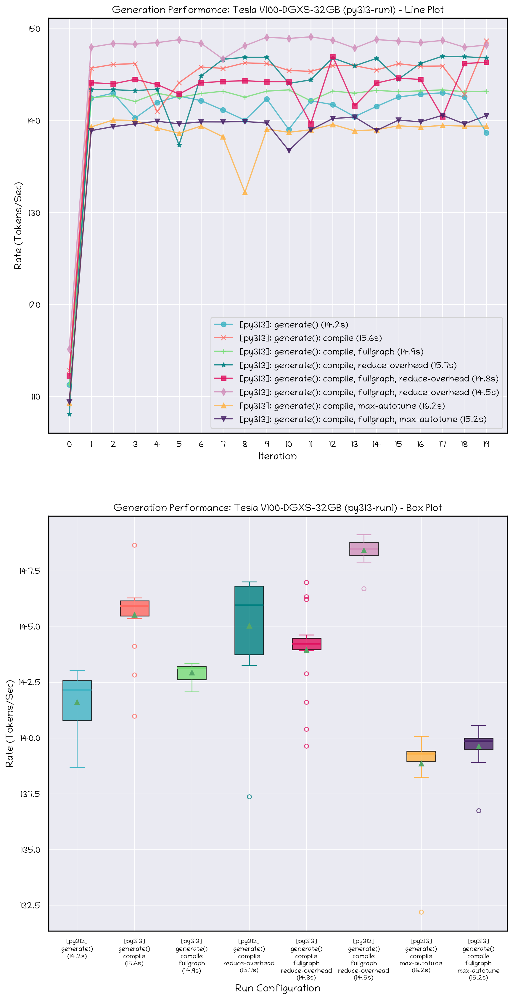

...

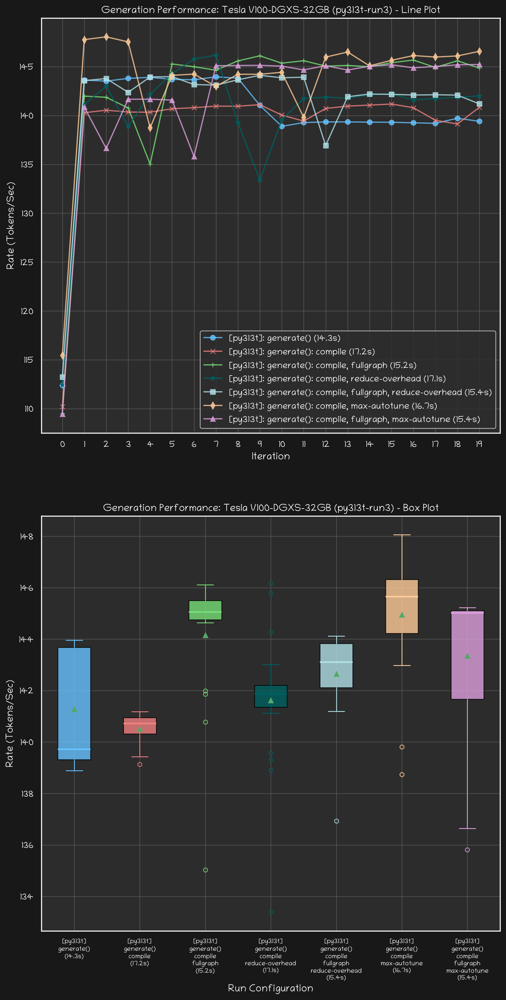

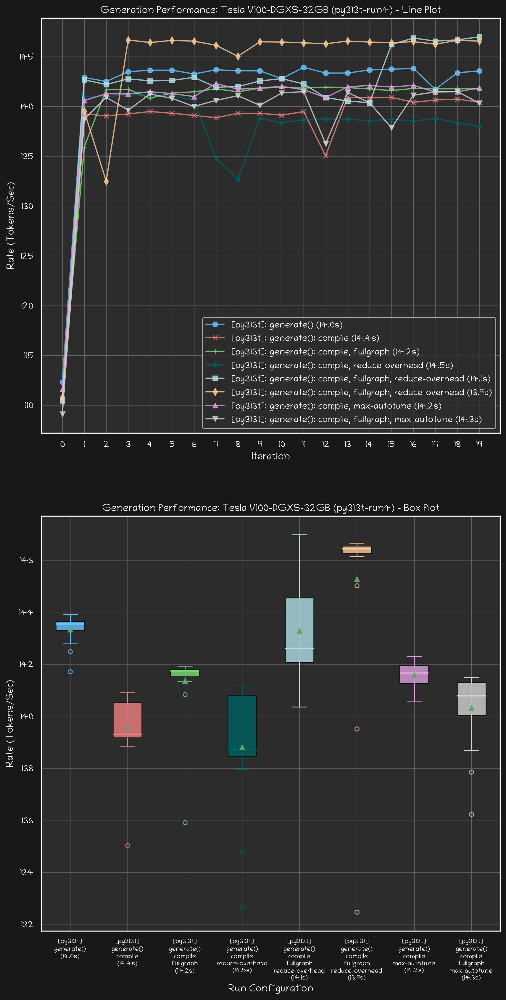

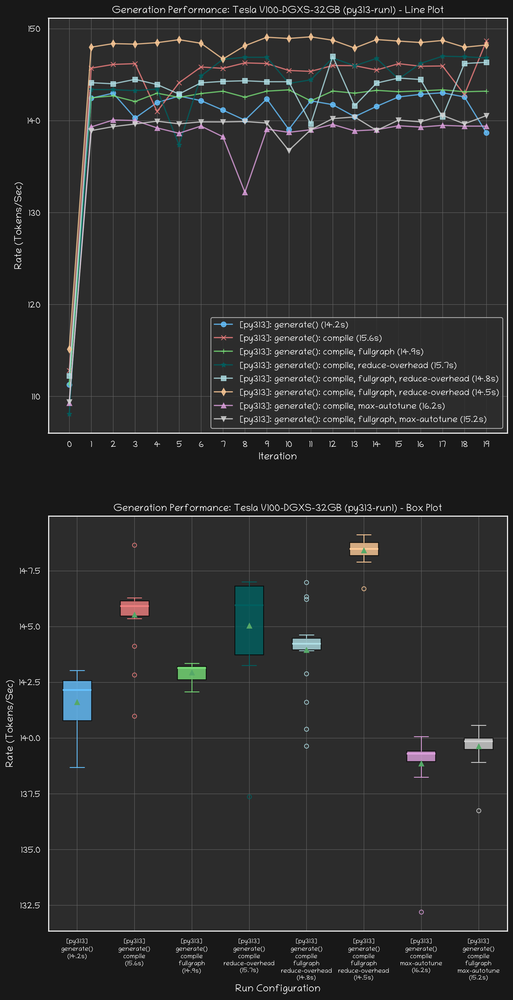

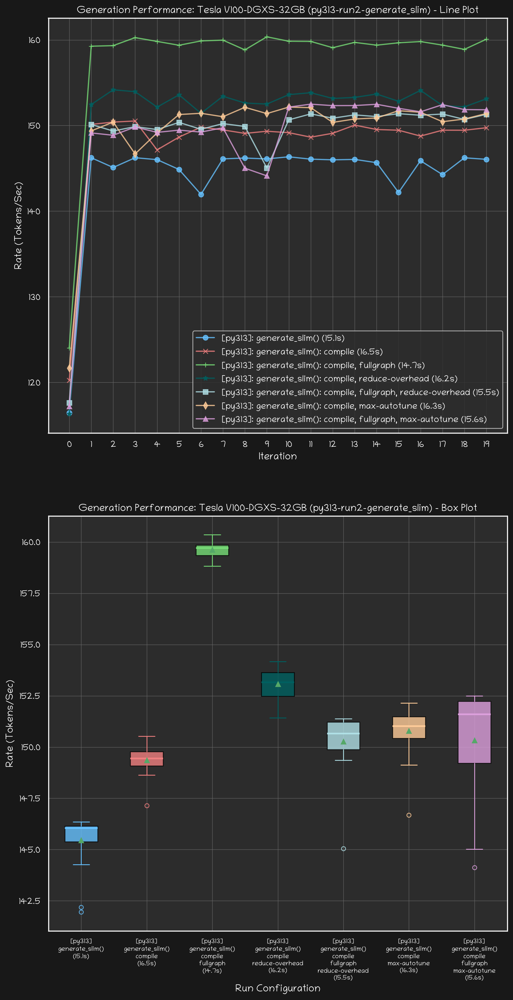

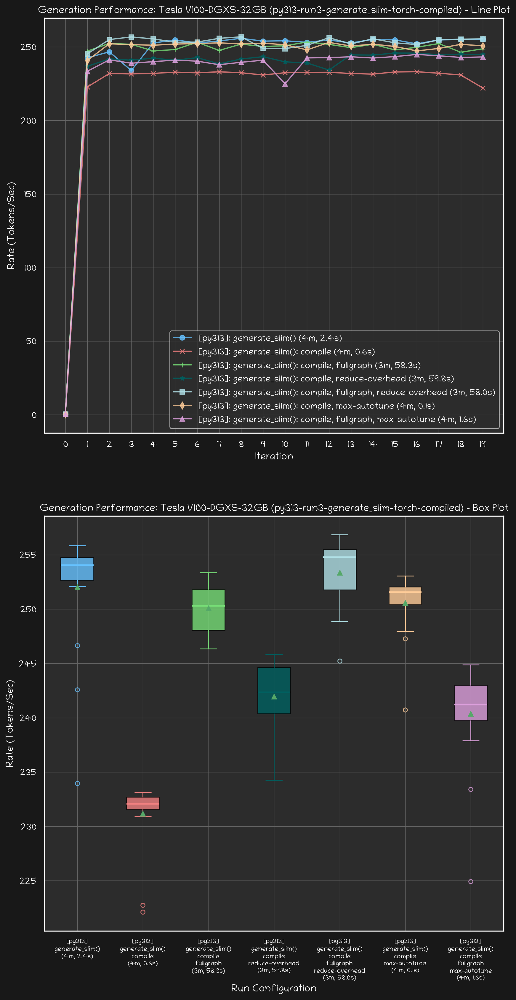

In [6]:
run_names = [
    'py313t-run1',
    'py313t-run2',
    'py313t-run3',
    'py313t-run4',
    'py313-run1',
    'py313-run2-generate_slim',    
    'py313-run3-generate_slim-torch-compiled',
]
for mode in ('light', 'dark'):
    for run_name in run_names:
        runs = GenerateRun.load_all_from_directory(f'json/{run_name}')
        device_names = {run.device_name for run in runs}
        assert len(device_names) == 1
        device_name = runs[0].device_name
        GenerateRun.plot_rates_combined(
            runs=runs,
            mode=mode,
            title=f'Generation Performance: {device_name} ({run_name})',
            filename=f'{run_name}-combined-{mode}.svg',
            skip_first=True,
        )